In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
%matplotlib inline


pd.options.display.max_columns = 500
pd.options.display.max_rows = 500

In [2]:
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_confirmed.drop(columns = ['Province/State', 'Lat', 'Long'], inplace = True)
df_confirmed.rename(columns = {'Country/Region':'Country'}, inplace = True)
df_confirmed.head()

,Country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20
0,Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,4,4,5,7,7,7,11,16,21,22,22,22,24,24,40,40,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142,22890,23546,24102,24766,25527,26310,26874,27532,27878,28424,28833,29157,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190,33384,33594,33908,34194,34366,34451,34455,34740,34994,35070,35229,35301,35475,35526,35615,35727,35928,35981,36036,36157,36263,36368,36471,36542,36675,36710,36710,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345,37424,37431,37551,37596,37599,37599,37599,37856,37894,37953,37999,38054,38070,38113,38129,38140,38143,38162,38165,38196,38243,38288,38304,38324,38398,38494,38520,38544,38572,38606,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074,39096,39145,39170,39186,39192,39227,39233,39254,39268,39285,39290,39297,39341,39422,39486,39548,39616,39693
1,Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,10,12,23,33,38,42,51,55,59,64,70,76,89,104,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099,1122,1137,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341,1385,1416,1464,1521,1590,1672,1722,1788,1838,1891,1962,1995,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964,3038,3106,3188,3278,3371,3454,3571,3667,3752,3851,3906,4008,4090,4171,4290,4358,4466,4570,4637,476

In [3]:
df = df_confirmed.T
df.drop(index = 'Country', inplace = True)
df.columns = df_confirmed['Country']
df.index = pd.to_datetime(df.index)
df.head()

Country,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burma,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Canada,Central African Republic,Chad,Chile,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Cote d'Ivoire,Croatia,Cuba,Cyprus,Czechia,Denmark,Denmark,Denmark,Diamond Princess,Djibouti,Dominica,Dominican Republic,Ecuador,Egypt,El Salvador,Equatorial Guinea,Eritrea,Estonia,Eswatini,Ethiopia,Fiji,Finland,France,France,France,France,France,France,France,France,France,France,France,Gabon,Gambia,Georgia,Germany,Ghana,Greece,Grenada,Guatemala,Guinea,Guinea-Bissau,Guyana,Haiti,Holy See,Honduras,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Jamaica,Japan,Jordan,Kazakhstan,Kenya,"Korea, South",Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Liechtenstein,Lithuania,Luxembourg,MS Zaandam,Madagascar,Malawi,Malaysia,Maldives,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Monaco,Mongolia,Montenegro,Morocco,Mozambique,Namibia,Nepal,Netherlands,Netherlands,Netherlands,Netherlands,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Macedonia,Norway,Oman,Pakistan,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Qatar,Romania,Russia,Rwanda,Saint Kitts and Nevis,Saint Lucia,Saint Vincent and the Grenadines,San Marino,Sao Tome and Principe,Saudi Arabia,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Syria,Taiwan*,Tajikistan,Tanzania,Thailand,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,US,Uganda,Ukraine,United Arab Emirates,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,14,6,1,0,26,2,1,4,1,0,5,0,444,4,0,1,2,0,2,1,1,0,0,2,9,1,5,4,0,0,1,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,22,9,5,2,32,5,3,5,1,2,5,2,444,9,0,5,7,1,3,2,1,0,3,6,16,1,8,4,0,2,2,27,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,15,36,27,10,2,53,23,3,8,2,4,9,2,549,24,1,9,18,3,4,2,2,0,5,15,20,1,15,8,0,2,5,43,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,

In [4]:
df.shape

(262, 266)

There are many columns in the dataframe which are duplicated (as they represent district/region of a particular country)

In [5]:
for col in df_confirmed['Country'].value_counts()[df_confirmed['Country'].value_counts()>1].index:
    temp = df.loc[:,[col]]
    df.drop(columns = col, inplace = True)
    df[col] = temp.sum(axis = 'columns')
    del(temp)

In [6]:
df = df.loc[:,['India', 'US', 'United Kingdom', 'Italy', 'Spain', 'Germany', 'France', 'China', 'Iran', 'Russia']]
df.head()

Country,India,US,United Kingdom,Italy,Spain,Germany,France,China,Iran,Russia
2020-01-22,0,1,0.0,0,0,0,0.0,548.0,0,0
2020-01-23,0,1,0.0,0,0,0,0.0,643.0,0,0
2020-01-24,0,2,0.0,0,0,0,2.0,920.0,0,0
2020-01-25,0,2,0.0,0,0,0,3.0,1406.0,0,0
2020-01-26,0,5,0.0,0,0,0,3.0,2075.0,0,0


In [7]:
df.shape

(262, 10)

In [8]:
colors = dict(zip(
    ['India', 'US', 'United Kingdom', 'Italy', 'Spain', 'Germany', 'France', 'China', 'Iran', 'Russia'],
    ['#FF6133', '#ff9999', '#ff8000', '#7BFF33','#aafbff', '#f7bb5f', '#eafb50', '#33FFC0', '#D7FF33', '#33C6FF']
))

### Individual bar charts for specific dates

In [10]:
s = df.loc['2020-10-09',:].sort_values(ascending = True)
s

Country
China               90751
Germany            320495
Italy              343770
Iran               492378
United Kingdom     578390
France             732434
Spain              861112
Russia            1265572
India             6979423
US                7663293
Name: 2020-10-09 00:00:00, dtype: object

Make a horizontal bar chart with matplotlib using the country names as the y-values and total deaths as the x-values (width of bars). 

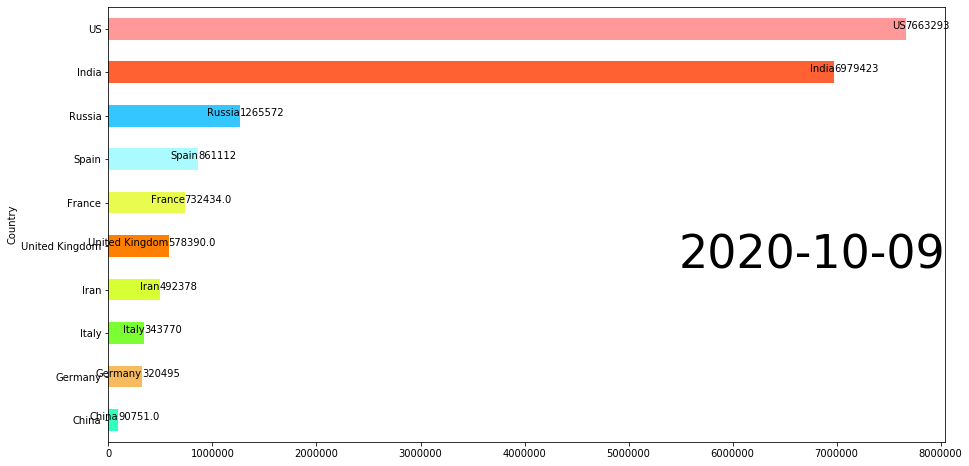

In [11]:
fig, ax = plt.subplots(figsize=(15, 8));
ax = s.plot(kind = 'barh', color = [colors[x] for x in s.index]);
for i, (Country, count) in enumerate(zip(s.index, s.values)):
    ax.text(count, i,     Country,            ha='right');  # Tokyo: name
    ax.text(count, i,     count,           ha='left');   # 38194.2: value
    
# Add year right middle portion of canvas
ax.text(1, 0.4, '2020-10-09', transform=ax.transAxes, size=46, ha='right');

### Adding more style to bar chart

Moving our code to draw_barchart function.

Need to style the following items:

- Text: Update font sizes, color, orientation
- Axis: Move X-axis to top, add color & subtitle
- Grid: Add lines behind bars
- Format: comma separated values and axes tickers
- Add title, credits, gutter space
- Remove: box frame, y-axis labels

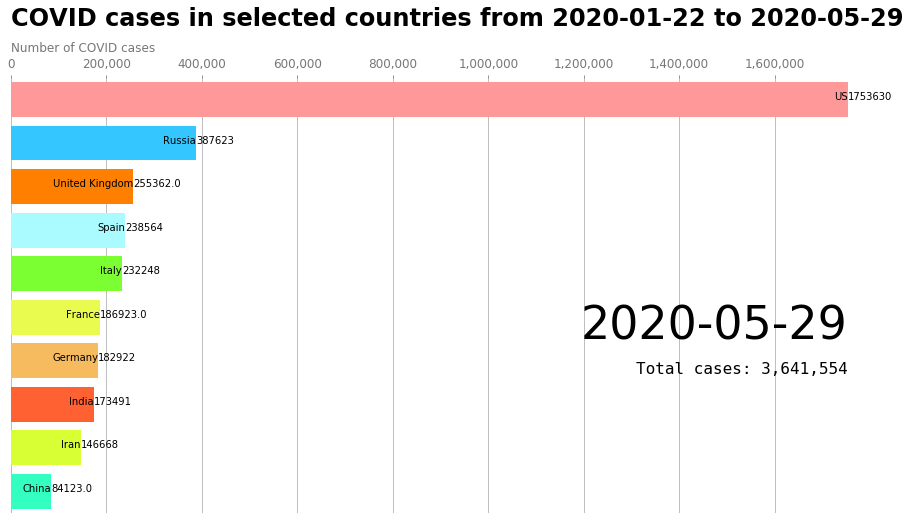

In [12]:
fig, ax = plt.subplots(figsize=(15, 8));
# colors = plt.cm.Dark2(range(len(s)))
global covid_sum
covid_sum = 0
def draw_barchart(i):
    s = df.iloc[i,:].sort_values(ascending = True)
    global covid_sum
    covid_sum = int(covid_sum + s.sum())
    ax.clear()
#     ax = s.plot(kind = 'barh', color = [colors[x] for x in s.index]);
    ax.barh(s.index, s.values, color = [colors[x] for x in s.index])

    for j, (Country, count) in enumerate(zip(s.index, s.values)):
        ax.text(count, j,     Country,            ha='right');  # Tokyo: name
        ax.text(count, j,     count,           ha='left');   # 38194.2: value

    # Add year right middle portion of canvas
    tdate = df.index[i].strftime('%Y-%m-%d')
    ax.text(1, 0.4, tdate, transform=ax.transAxes, size=46, ha='right');
    ax.text(1, 0.32, 'Total cases: ' + "{:,}".format(covid_sum) ,transform=ax.transAxes, size=16, ha='right', 
            family = 'monospace');
    ax.text(0, 1.06, 'Number of COVID cases ', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) # Puts comma after 1000 places
    ax.xaxis.set_ticks_position('top');
    ax.tick_params(axis='x', colors='#777777', labelsize=12);
    ax.set_yticks([]);
    ax.margins(0, 0.01);
    ax.grid(which='major', axis='x', linestyle='-');
    ax.set_axisbelow(True);
    title = 'COVID cases in selected countries from {} to {}'.format(df.index.min().strftime('%Y-%m-%d'), 
                                                                          df.index[i].strftime('%Y-%m-%d'));
    ax.text(0, 1.12, title,transform=ax.transAxes, size=24, weight=600, ha='left');
    plt.box(False);
    
draw_barchart(128)

In [13]:
len(df.index)

262

In [14]:
pd.date_range(df.index.min(), df.index.max())

DatetimeIndex(['2020-01-22', '2020-01-23', '2020-01-24', '2020-01-25',
               '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29',
               '2020-01-30', '2020-01-31',
               ...
               '2020-09-30', '2020-10-01', '2020-10-02', '2020-10-03',
               '2020-10-04', '2020-10-05', '2020-10-06', '2020-10-07',
               '2020-10-08', '2020-10-09'],
              dtype='datetime64[ns]', length=262, freq='D')

## Animating the bar chart

To animate the race, we will use [FuncAnimation](https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.animation.FuncAnimation.html) from matplotlib.animation.

__FuncAnimation__ creates an animation by repeatedly calling a function (that draws on canvas). In our case, that function will be draw_barchart. We also use frames, this argument accepts on what values you want to run `draw_barchart` – we’ll run from January 22 to the most recent date data available.

- The `blit` keyword is an important: it tells the animation to only re-draw the pieces of the plot which have changed. The time saved with `blit = True` means that the animations display much more quickly. But sometimes throws an error _RuntimeError: The init_func must return a sequence of Artist objects_. __If blit == True, init_func must return an iterable of artists to be re-drawn. This information is used by the blitting algorithm to determine which parts of the figure have to be updated.__

- `frames` is the number of frames to be shown in the animation. (Here it will 138 frames)
- `cache_frame_data`: Controls whether frame data is cached. (Boolean)

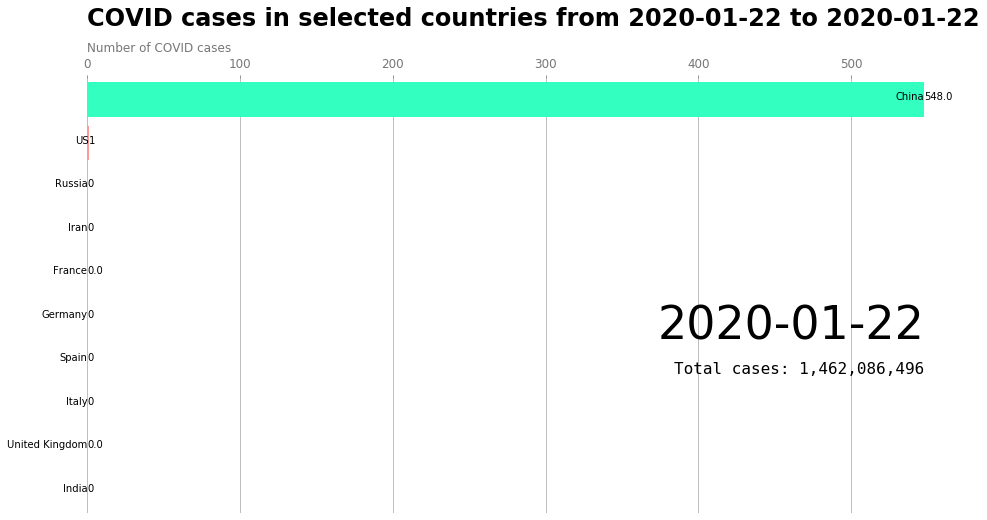

In [15]:
global covid_sum
covid_sum = 0
fig, ax = plt.subplots(figsize=(15, 8));
animator = animation.FuncAnimation(fig, draw_barchart, frames = range(0, len(df.index)), interval = 350, 
                                   cache_frame_data = False);
HTML(animator.to_jshtml())

#### Reference:  
1. [Bar Chart Race in Python with Matplotlib](https://towardsdatascience.com/bar-chart-race-in-python-with-matplotlib-8e687a5c8a41)
2. [Create a Bar Chart Race Animation in Python with Matplotlib](https://www.dunderdata.com/blog/create-a-bar-chart-race-animation-in-python-with-matplotlib)
3. [Save Matplotlib Animations as GIFs](http://louistiao.me/posts/notebooks/save-matplotlib-animations-as-gifs/)